In [58]:
import os
os.environ["PYOPENGL_PLATFORM"] = "egl"
import pyrender
import cv2
import glob
import json
import time
import trimesh
import numpy as np
import matplotlib.pyplot as plt
np.set_printoptions(suppress=True, precision=3)
from scipy.spatial.transform import Rotation as R
from bpc.inference.utils.camera_utils import load_camera_params
from bpc.inference.process_pose import PoseEstimator, PoseEstimatorParams, load_pose_model
from bpc.utils.data_utils import Capture, render_mask
import bpc.utils.data_utils as du
import importlib
print("Importation Completed")

Importation Completed


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000007/scene_camera_cam3.json
[array([[  -0.133,    0.058,   -0.989,  373.035],
       [   0.991,   -0.025,   -0.135,  265.094],
       [  -0.033,   -0.998,   -0.054, 1734.644],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.042,    0.902,   -0.43 ,   28.142],
       [   0.003,   -0.431,   -0.902,  186.917],
       [  -0.999,    0.036,   -0.021, 1738.924],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.044,    0.925,   -0.378,  235.189],
       [  -0.015,   -0.377,   -0.926,   20.917],
       [  -0.999,    0.046,   -0.002, 1749.619],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.369,   -0.929,   -0.028,  421.987],
       [  -0.015,    0.024,   -1.   ,   70.805],
       [   0.929,    0.369,   -0.005, 1775.061],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x128

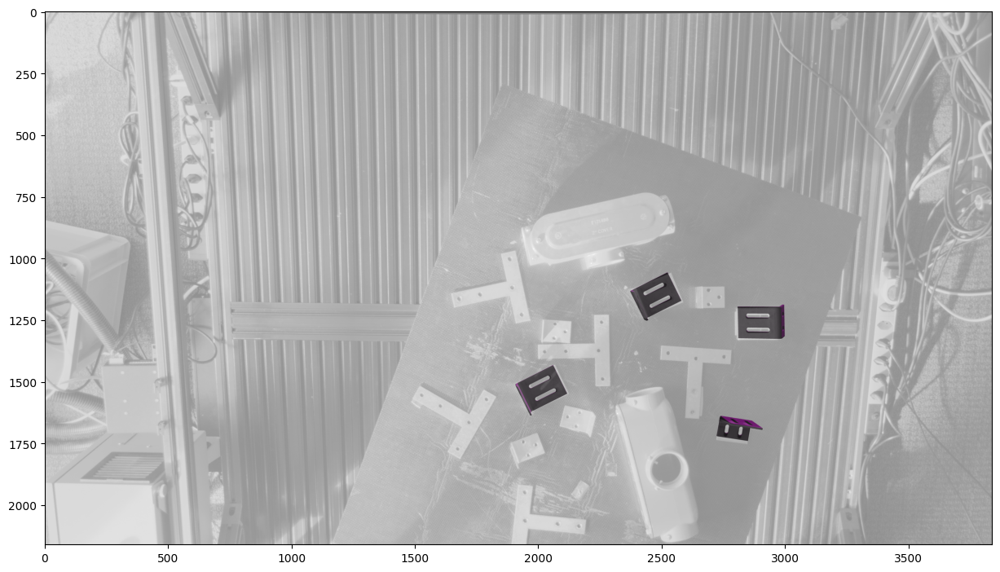

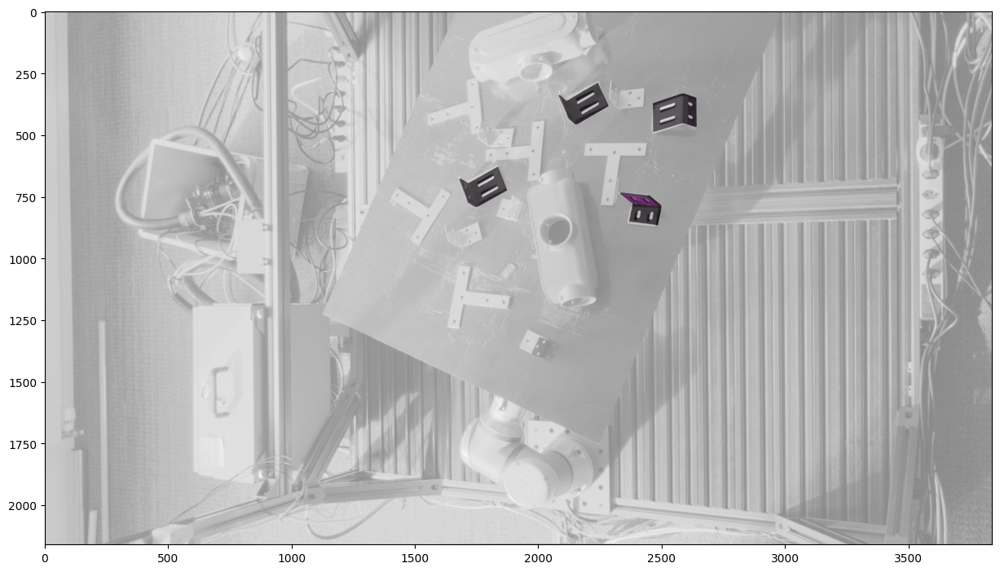

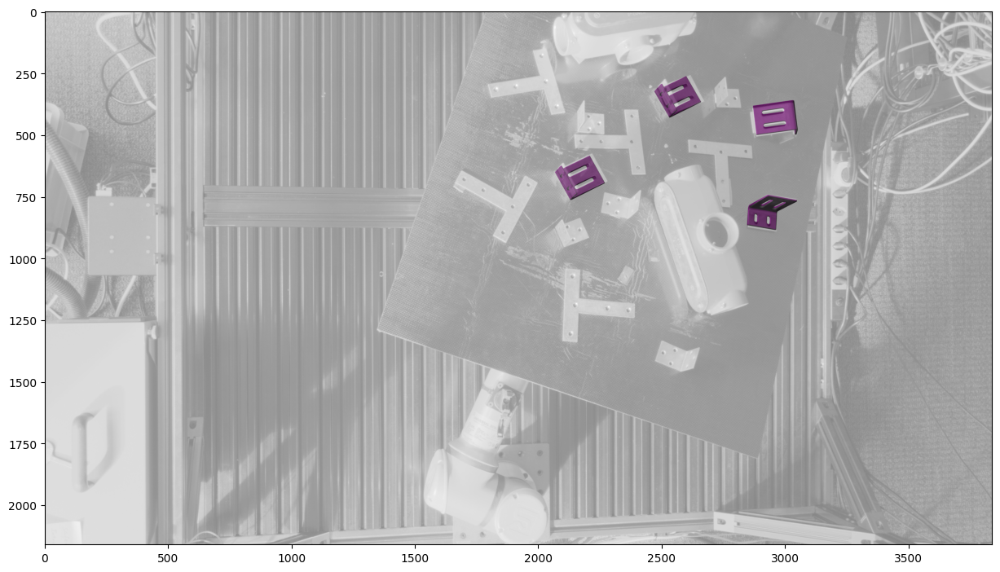

In [80]:
# Object ID - 0
# Avaliable Scence and Detected - 000007 & 000012
# False Detection in - 
scene_dir = "./ipd/ipd_val/val/000007/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 0
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01,
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_1, 4.7ms
Speed: 6.0ms preprocess, 4.7ms inference, 0.7ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.2ms
Speed: 4.0ms preprocess, 4.2ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_1, 4.4ms
Speed: 3.9ms preprocess, 4.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.5031063556671143


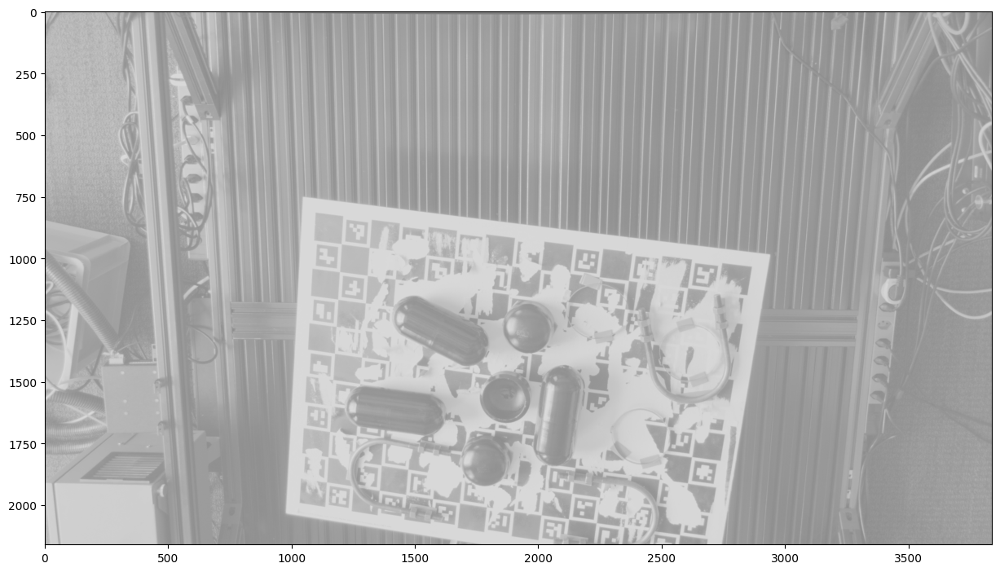

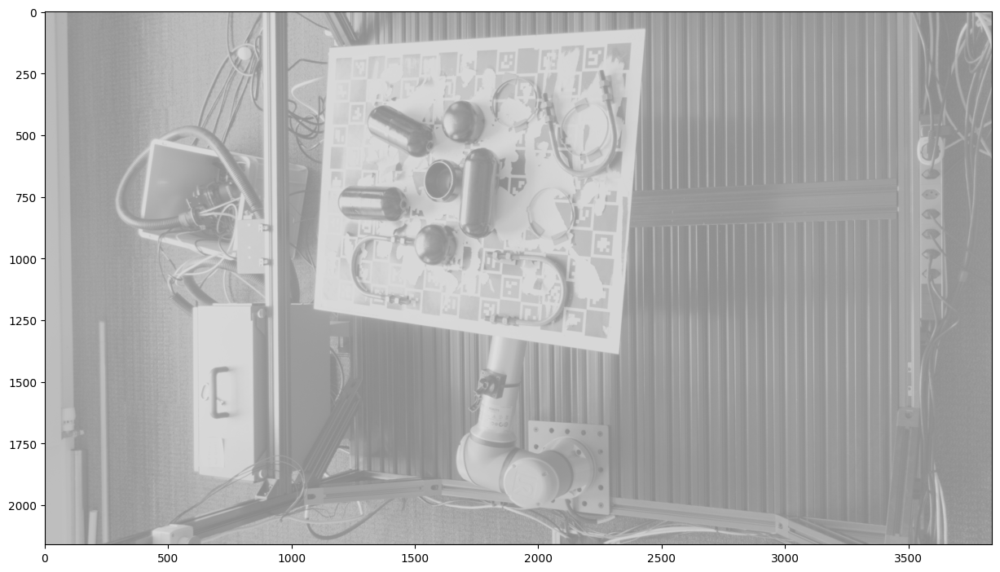

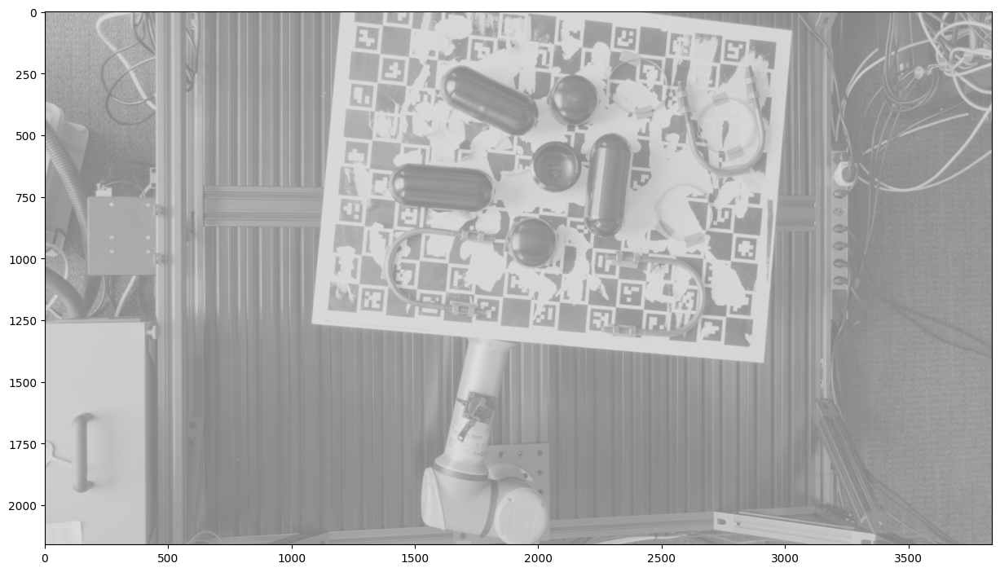

In [101]:
# Object ID - 1
# Avaliable Scence and Detected - 000006 & 000008 (alignment problem???)  & 000011 & 000013 (Need to check!)
# False Detection in 000005 & 000007 
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 1
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01,
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.3ms
Speed: 4.0ms preprocess, 4.3ms inference, 0.3ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 3.8ms
Speed: 3.8ms preprocess, 3.8ms inference, 0.3ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 3.8ms
Speed: 4.0ms preprocess, 3.8ms inference, 0.3ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.4993424415588379


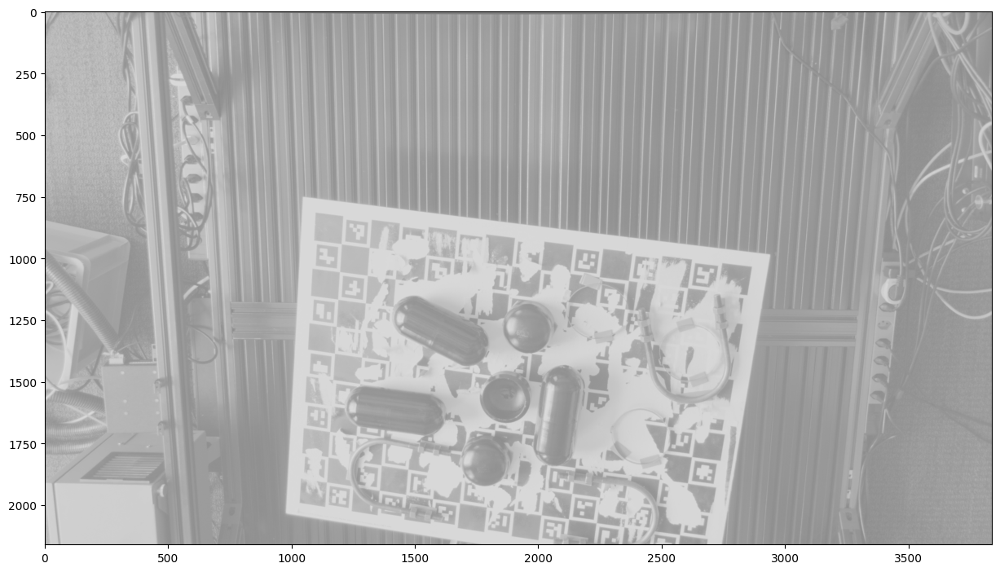

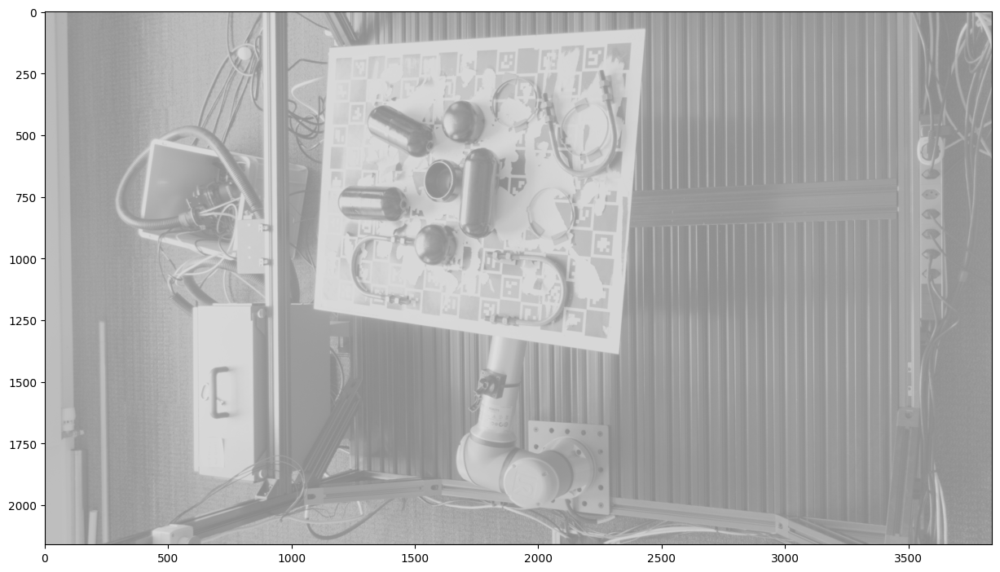

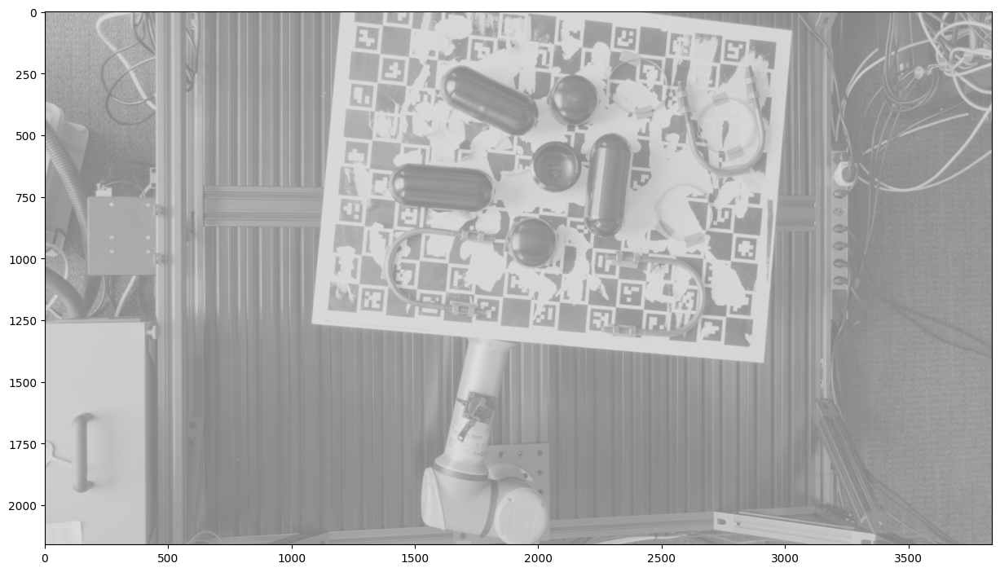

In [121]:
# Object ID - 4
# Avaliable Scence and Detected -  000009 (check)  & 000013 (Check) 
# False Detection in  000003 (check) & 000005 & 000006 (check) & 000007 & 000008 
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 4
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000000/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_8, 4.8ms
Speed: 4.9ms preprocess, 4.8ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.9ms
Speed: 4.9ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.9ms
Speed: 5.9ms preprocess, 4.9ms inference, 0.5ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.5236063003540039


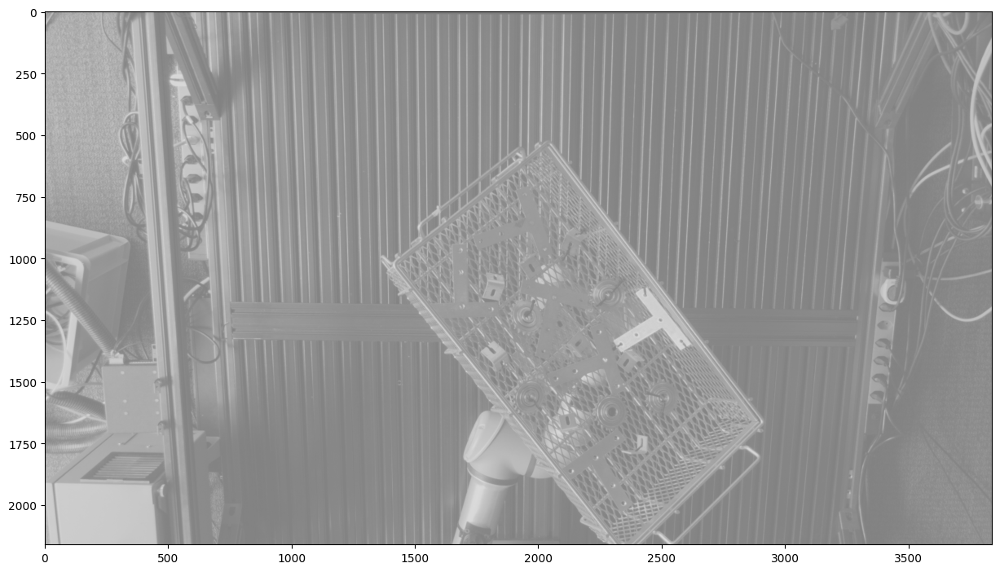

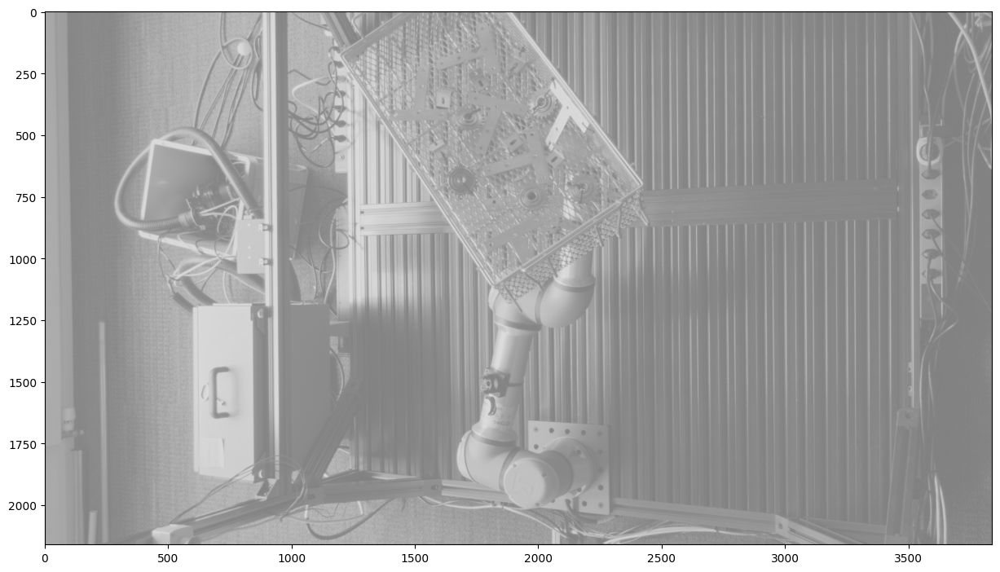

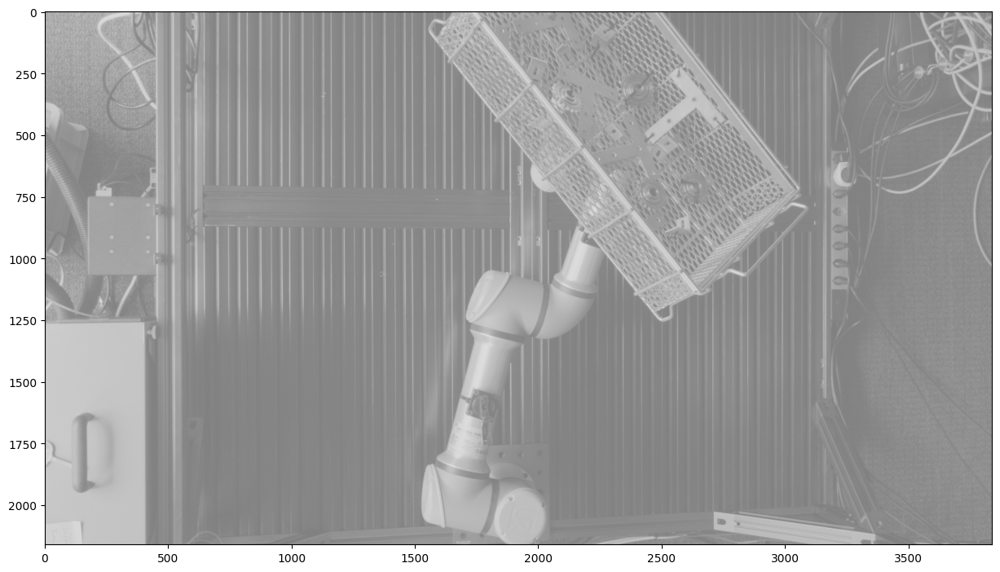

In [139]:
# Object ID - 8
# Avaliable Scence and Detected -  000011 & 000010 & 000004 & 000003 
# False Detection in   
scene_dir = "./ipd/ipd_val/val/000000/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 8
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 5 object_10s, 4.0ms
Speed: 3.7ms preprocess, 4.0ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.7ms
Speed: 3.8ms preprocess, 4.7ms inference, 0.7ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_10, 7.6ms
Speed: 5.4ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.5139729976654053


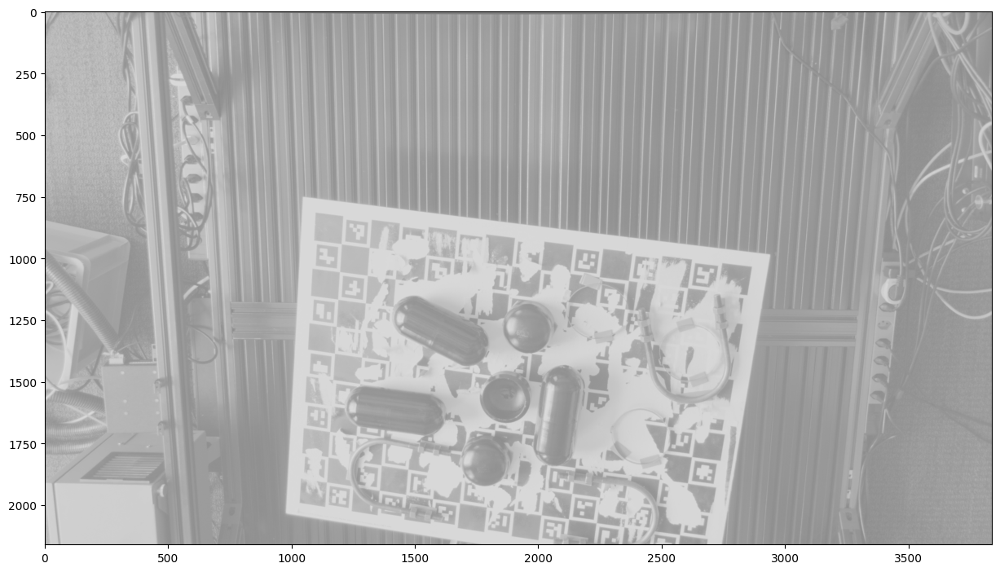

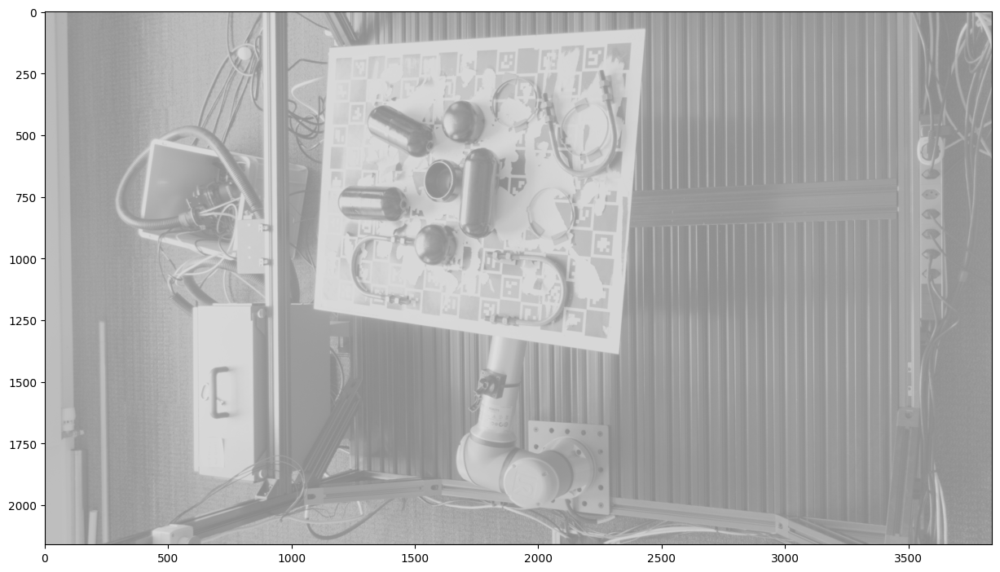

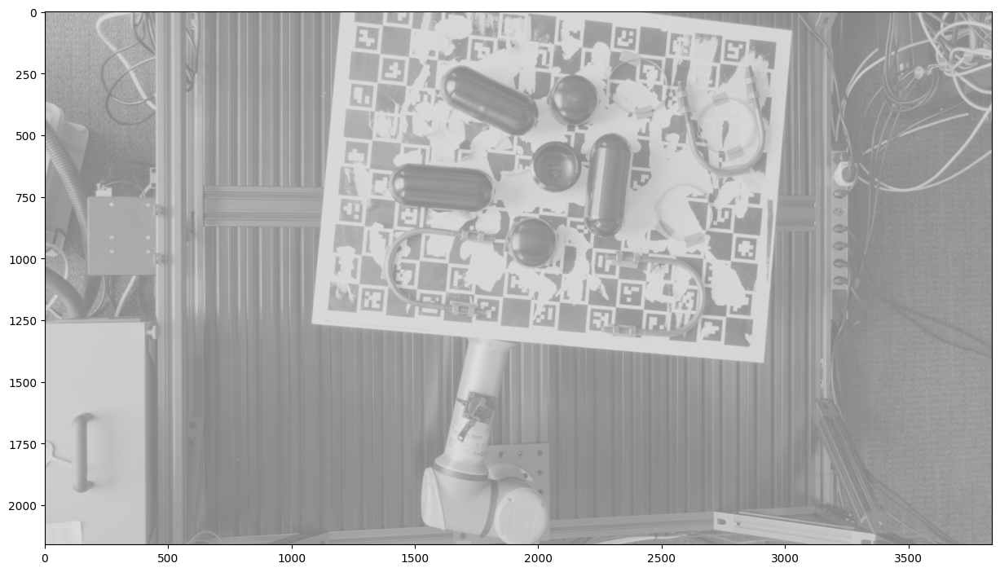

In [159]:
# Object ID - 10
# Avaliable Scence and Detected - 000005 & 000011
# False Detection in   000003 & 000008 & 000009 
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 10
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000000/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.4ms
Speed: 4.9ms preprocess, 4.4ms inference, 0.3ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_11, 4.4ms
Speed: 4.8ms preprocess, 4.4ms inference, 1.0ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.5ms
Speed: 4.0ms preprocess, 4.5ms inference, 0.3ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.5186431407928467


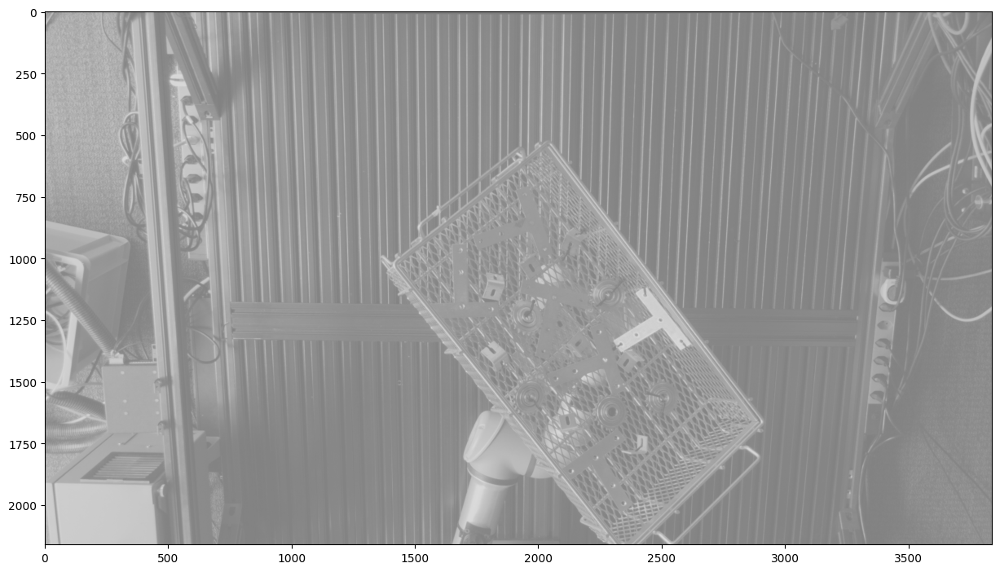

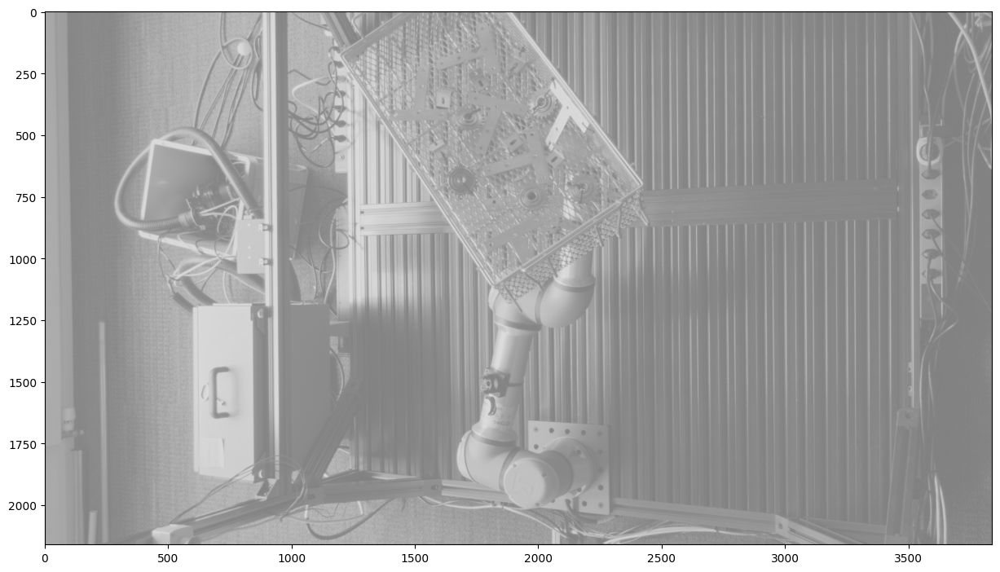

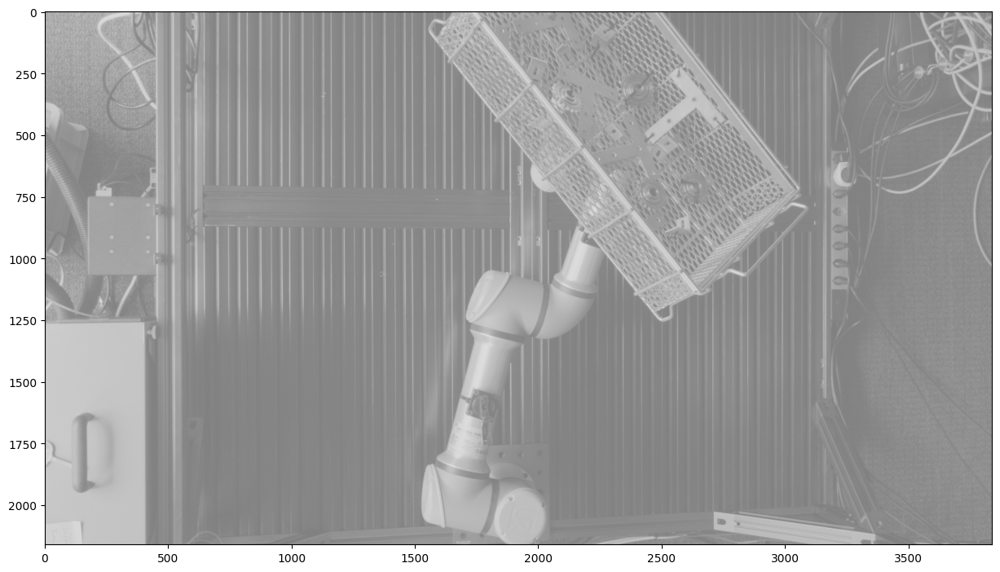

In [184]:
# Object ID - 11
# Avaliable Scence and Detected - 000010 & 000003 & 000002
# False Detection in 000008 (Check) & 000007 (low cost) & 000006 & 000005
scene_dir = "./ipd/ipd_val/val/000000/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 11
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[array([[   0.986,   -0.13 ,    0.101,   54.908],
       [   0.148,    0.968,   -0.204,  227.056],
       [  -0.071,    0.216,    0.974, 1689.635],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.041,   -0.985,    0.165, -230.139],
       [   0.873,   -0.116,   -0.474,  222.746],
       [   0.486,    0.125,    0.865, 1721.069],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.414,   -0.889,    0.196, -147.523],
       [   0.83 ,   -0.458,   -0.319,   80.059],
       [   0.373,    0.031,    0.927, 1679.779],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_14s, 4.7ms
Speed: 3.8ms preprocess, 4.7ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_14s, 5.0ms
Speed:

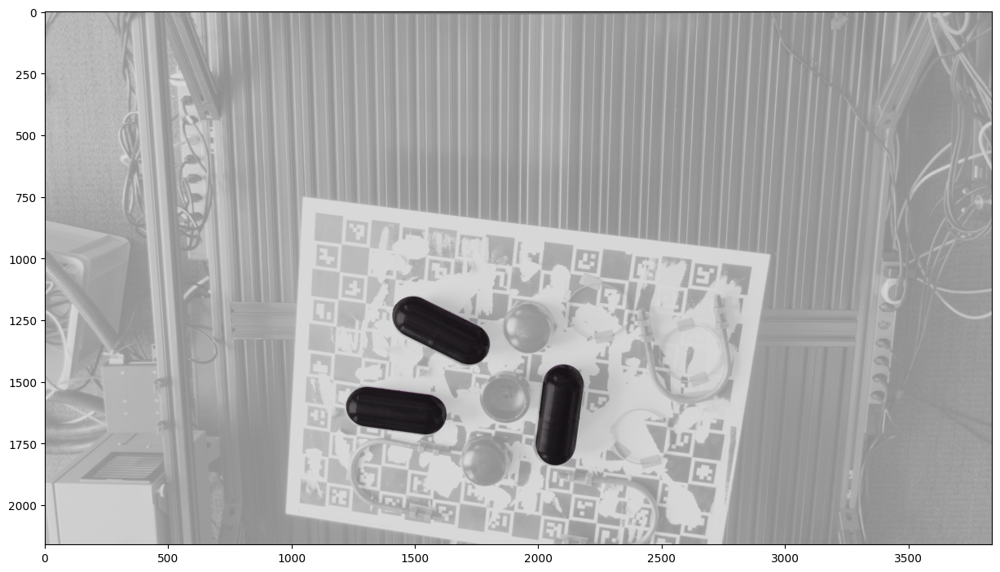

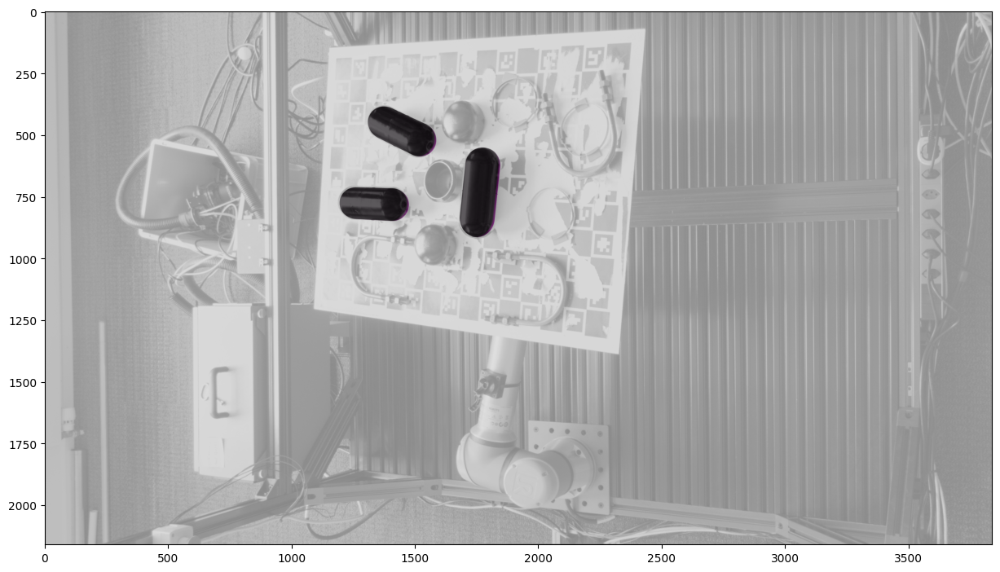

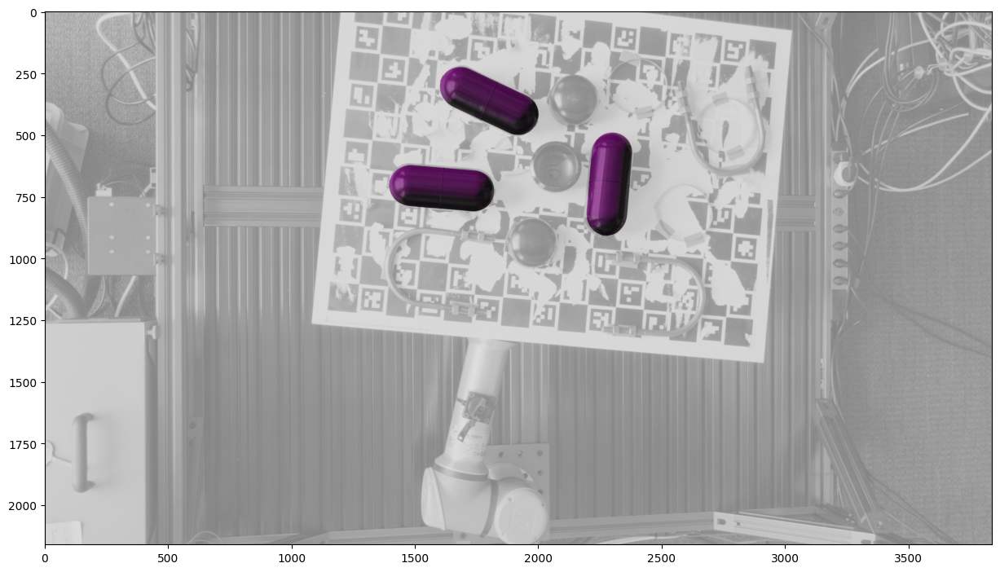

In [202]:
# Object ID - 14 
# Avaliable Scence and Detected - 000001 & 000008 & 000014
# False Detection in 000005
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 14
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000000/scene_camera_cam3.json
[array([[   0.912,    0.26 ,    0.318,   97.345],
       [  -0.311,   -0.068,    0.948,  149.256],
       [   0.269,   -0.963,    0.019, 1740.643],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.199,    0.301,    0.932,   38.913],
       [  -0.969,   -0.081,    0.233,   66.739],
       [   0.145,   -0.95 ,    0.276, 1730.628],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.519,    0.293,    0.803,  143.044],
       [  -0.851,   -0.081,   -0.519,  343.372],
       [  -0.087,   -0.953,    0.291, 1735.076],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.041,    0.277,   -0.96 , -114.297],
       [   0.997,   -0.079,    0.02 ,   -5.823],
       [  -0.07 ,   -0.958,   -0.279, 1690.562],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.9  ,    0.266,    0.344,  -32.17 ],
  

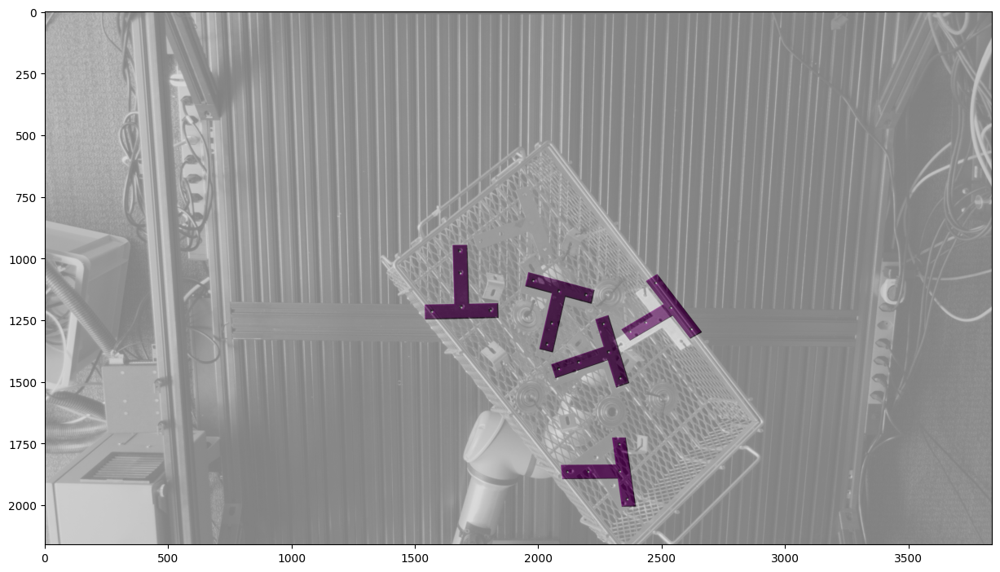

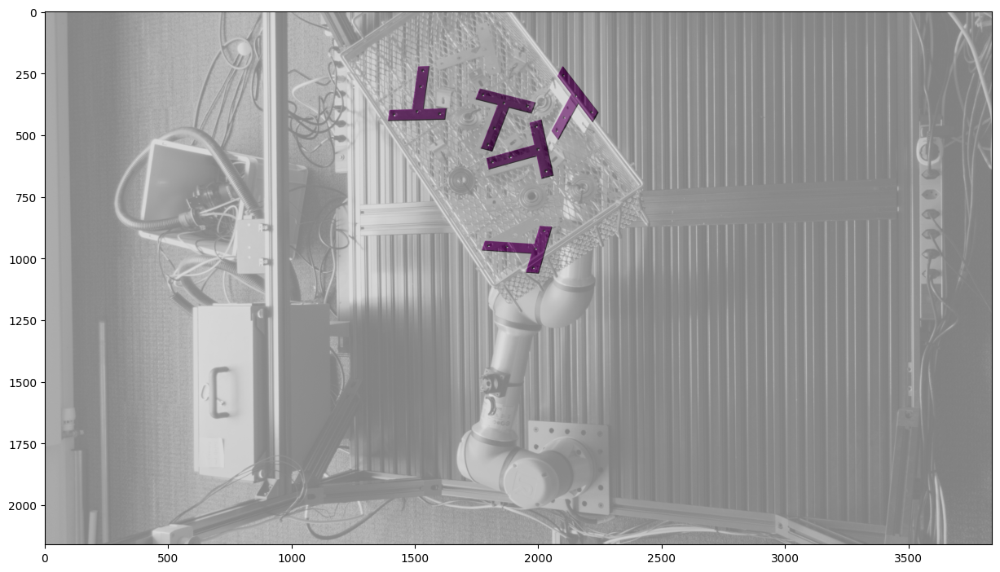

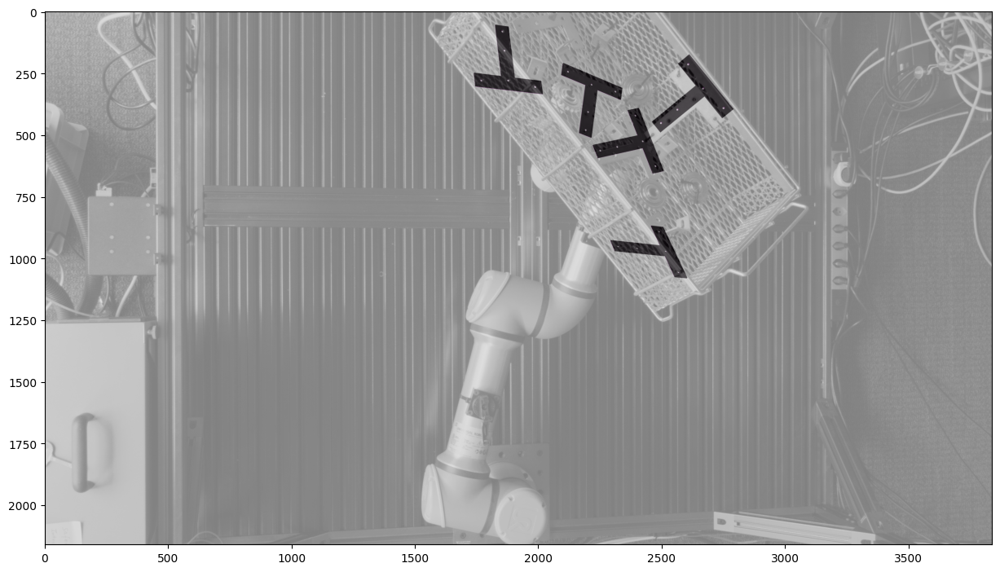

In [219]:
# Object ID - 18
# Avaliable Scence and Detected - 000012 & 000000 & 000007 & 
# False Detection in 000006
scene_dir = "./ipd/ipd_val/val/000000/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 18
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000014/scene_camera_cam3.json
[array([[  -0.084,   -0.994,    0.068,  142.964],
       [   0.971,   -0.097,   -0.217,  411.142],
       [   0.223,    0.048,    0.974, 1753.389],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[  -0.142,    0.979,   -0.149, -236.336],
       [   0.963,    0.171,    0.21 ,  349.049],
       [   0.231,   -0.113,   -0.966, 1781.625],
       [   0.   ,    0.   ,    0.   ,    1.   ]]), array([[   0.976,   -0.2  ,   -0.086,  274.093],
       [  -0.174,   -0.954,    0.245,  119.14 ],
       [  -0.131,   -0.224,   -0.966, 1675.382],
       [   0.   ,    0.   ,    0.   ,    1.   ]])]
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_19s, 4.9ms
Speed: 3.8ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 3 object_19s, 4.2ms
Speed:

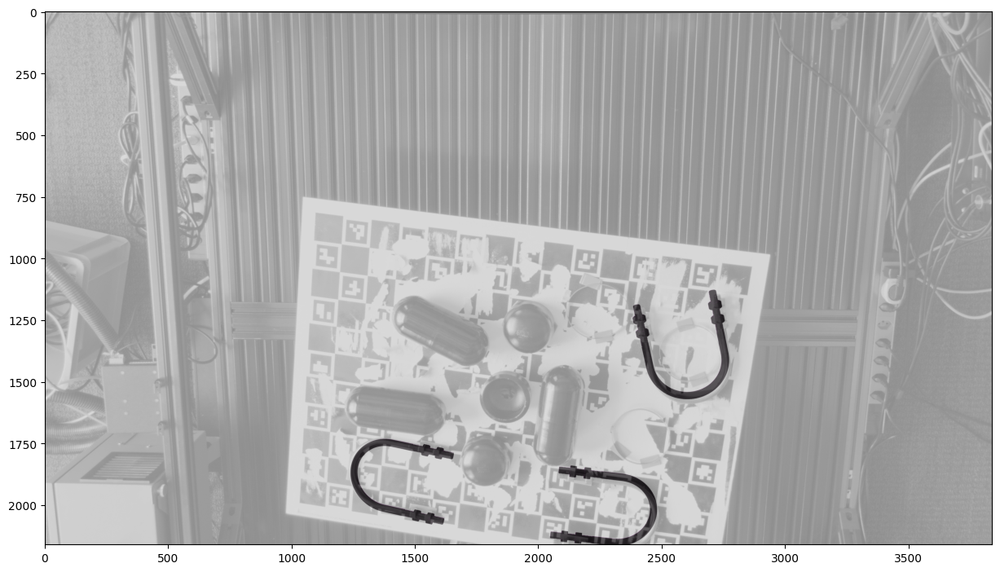

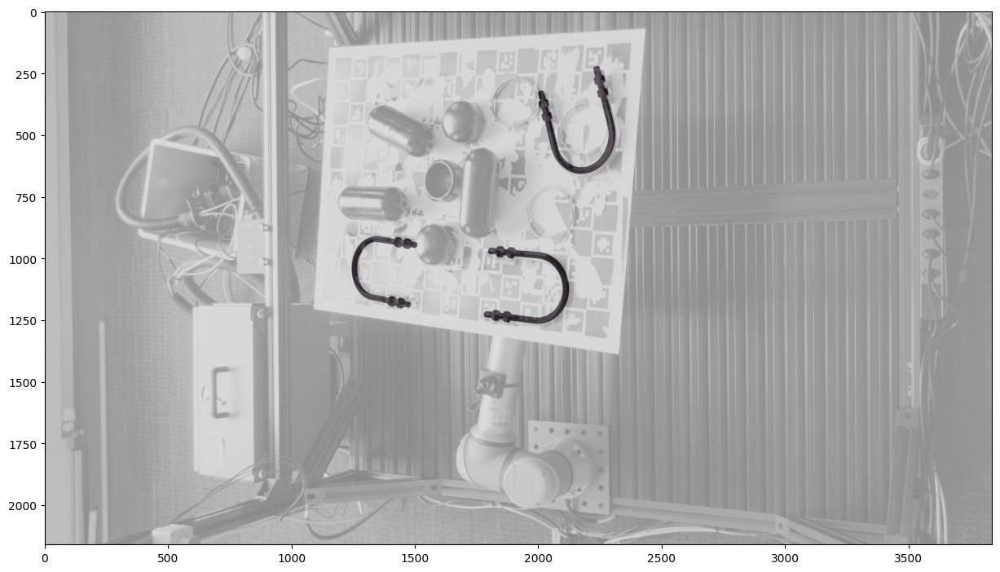

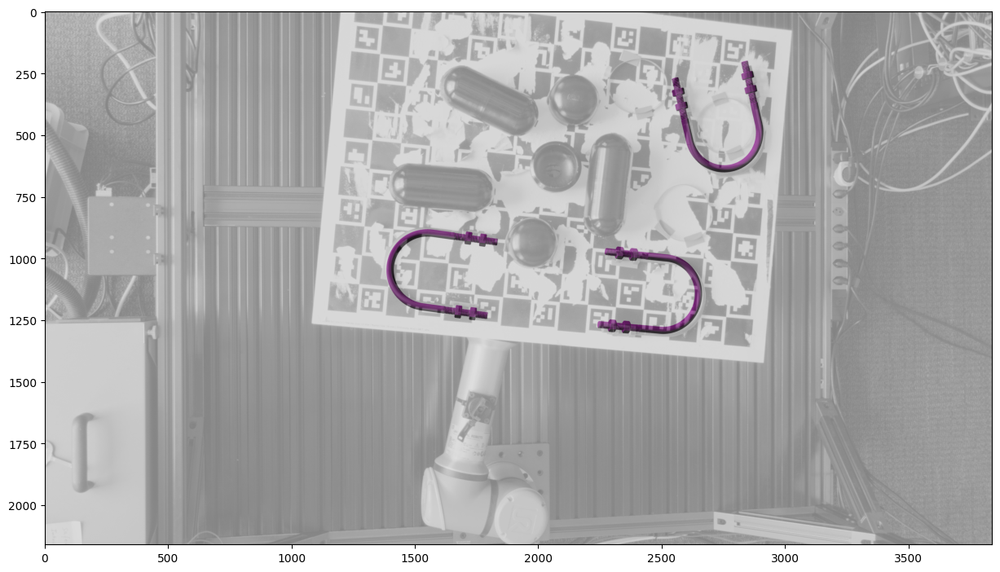

In [233]:
# Object ID - 19
# Avaliable Scence and Detected - 000009 & 000014
# False Detection in 000008
scene_dir = "./ipd/ipd_val/val/000014/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 1
obj_id = 19
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()


Auto-detected rotation mode from checkpoint: quat
Using rotation mode: quat
Loading camera parameters from: ./ipd/ipd_val/val/000000/scene_camera_cam3.json
[]
Processing image shape: (2160, 3840, 3)

0: 736x1280 1 object_20, 4.9ms
Speed: 3.8ms preprocess, 4.9ms inference, 0.7ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 (no detections), 4.4ms
Speed: 4.4ms preprocess, 4.4ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Processing image shape: (2160, 3840, 3)

0: 736x1280 2 object_20s, 4.6ms
Speed: 4.2ms preprocess, 4.6ms inference, 1.9ms postprocess per image at shape (1, 3, 736, 1280)

At least one camera has zero detections => no matching.
0.5222804546356201


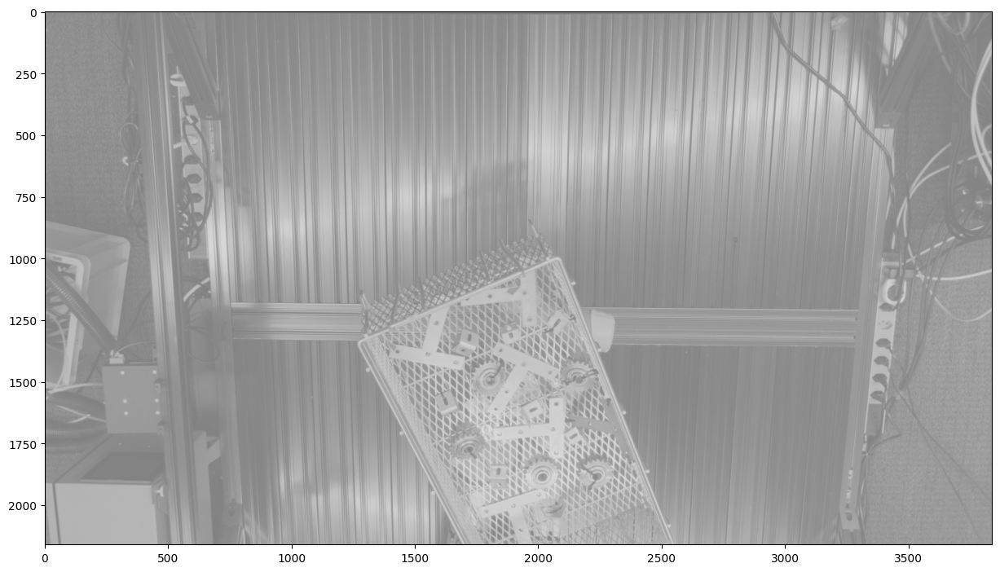

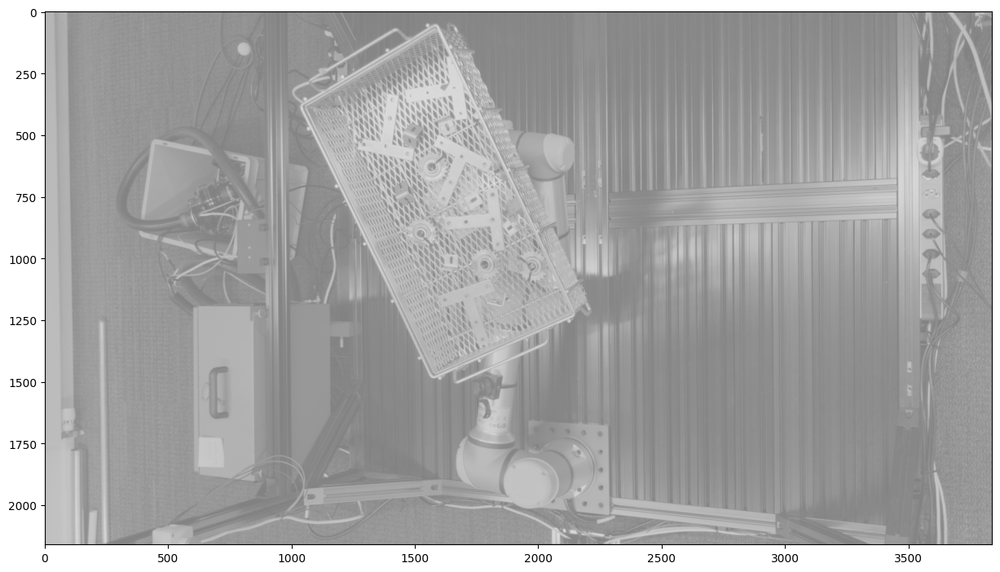

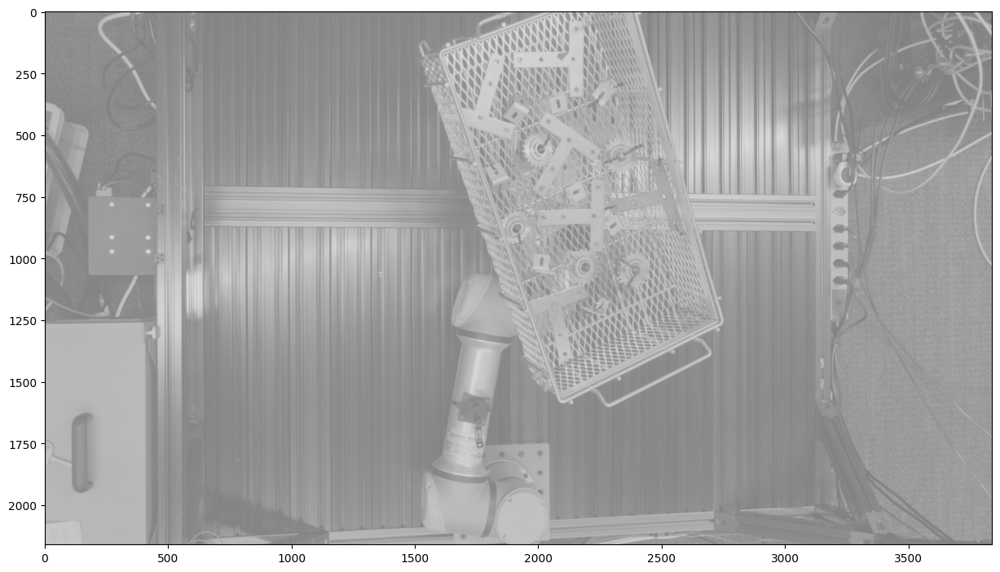

In [257]:
# Object ID - 20
# Avaliable Scence and Detected - 000011 & 000006 (check) & 000004 & 000002 (check)
# False Detection in 000014 & 000012 (check) & 000009 & 000008 & 000005 & 000001 & 000000 (low cost)
scene_dir = "./ipd/ipd_val/val/000000/"
models_dir = './ipd/ipd_models/models_eval/'
cam_ids = ["cam1", "cam2", "cam3"]
image_id = 2
obj_id = 20
obj_id_path = str(1000000+obj_id)[1:]
ply_file = os.path.join(models_dir, f"obj_{obj_id_path}.ply")
obj = trimesh.load(ply_file)
yolo_model_path = f'./models/detection/obj_{obj_id}/yolo11-detection-obj_{obj_id}.pt'
#pose_model_path = f'bpc/pose/pose_checkpoints/obj_{obj_id}/final_model.pth'
#pose_model_path = f'bpc/pose/val_checkpoints/obj_{obj_id}/best_model.pth'
pose_model_path = f'./models/rot_models/rot_{obj_id}.pth'
pose_params = PoseEstimatorParams(
    yolo_model_path=yolo_model_path,
    pose_model_path=pose_model_path, 
    yolo_conf_thresh=0.01
    #rotation_mode="quat"  # Using quaternion mode as in the checkpoint.
)
pose_estimator = PoseEstimator(pose_params)
t = time.time()
capture = Capture.from_dir(scene_dir, cam_ids, image_id, obj_id)
detections = pose_estimator._detect(capture)
pose_predictions = pose_estimator._match(capture, detections)
pose_estimator._estimate_rotation(pose_predictions)
print(time.time() - t)

for idx in range(len(capture.Ks)):
    plt.figure(figsize=(15, 15))
    plt.imshow(capture.images[idx])
    a, b = render_mask(obj, capture.Ks[idx], (capture.RTs[idx]), capture.images[0].shape[:2][::-1], [x.pose for x in pose_predictions])
    plt.imshow(a, alpha=0.5)
    plt.show()
